We need to find the shortest path trough all 200k cities.

Every 10th city needs to be a prime number.

So we need to do a k-means where 

### load and visualise the data to see what we are dealing with.

In [14]:
import pandas as pd 
import numpy as np, random, operator
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from ortools.constraint_solver import pywrapcp
from ortools.constraint_solver import routing_enums_pb2
import math

data = pd.read_csv("kaggle/cities.csv") #, skiprows=1, header=None) 
data.head()

,CityId,X,Y
0,0,316.836739,2202.340707
1,1,4377.405972,336.602082
2,2,3454.158198,2820.053011
3,3,4688.099298,2935.898056
4,4,1010.696952,3236.750989


In [15]:
np.shape(data)

(197769, 3)

In [16]:
def primes(n):
    """ Returns  a list of primes < n """
    sieve = [True] * n
    for i in range(3,int(n**0.5)+1,2):
        if sieve[i]:
            sieve[i*i::2*i]=[False]*((n-i*i-1)//(2*i)+1)
    return [2] + [i for i in range(3,n,2) if sieve[i]]

p = primes(197769)
newcol = np.zeros(197769, dtype='int')
for i in p:
    newcol[i] = 1

data['prime'] = newcol

data.head()

,CityId,X,Y,prime
0,0,316.836739,2202.340707,0
1,1,4377.405972,336.602082,0
2,2,3454.158198,2820.053011,1
3,3,4688.099298,2935.898056,1
4,4,1010.696952,3236.750989,0


### This is the image of the data with orange dots where prime numbers are.

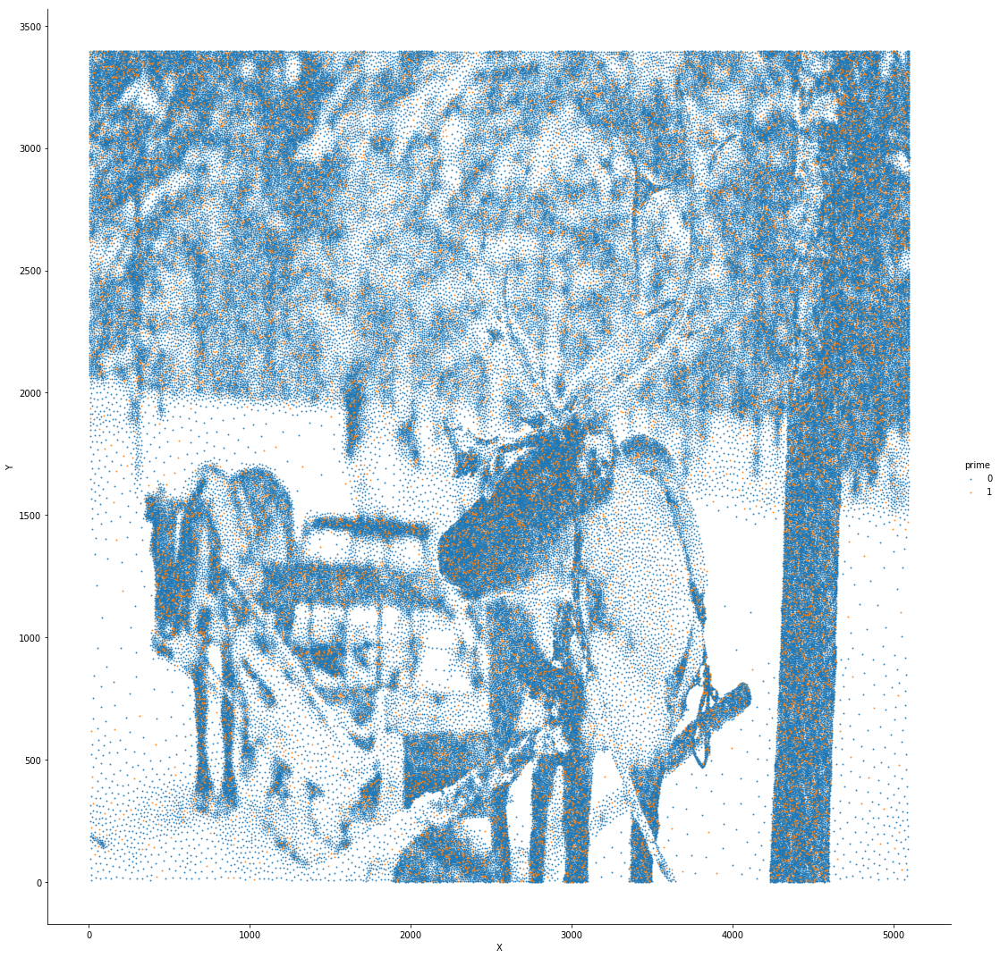

In [17]:
sns.lmplot("X","Y",data=data,fit_reg=False,scatter_kws={"s": 1},size=15,hue="prime")

### Now try k-means where each group of 10 is represented by one prime.

In [18]:
def is_prime(number):
    # if number is equal to or less than 1, return False
    if number <= 1:
        return False

    for x in range(2, number):
        # if number is divisble by x, return False
        if not number % x:
            return False
    return True

#for i in range(1,100):
#    print([i, is_prime(i)>0])

#clusterdata = {"X":data["X"],"Y":data["Y"],"cluster":np.zeros(197768)}

#for i in range(0,197769):
#    clusterdata["X"].append(data[i]['X']);
#    clusterdata["Y"].append(data[i]['Y']);

#clusterdata[["X","Y"]] = data[["X","Y"]]

#clusterdata["X"].append(1)
#clusterdata["X"].append(2)
#print(clusterdata)

#datacopy = data.drop("CityId", axis=1)
#datacopy = datacopy.drop("prime", axis=1)
#datacopy["cluster"] = 0;
#datacopy.head()

In [29]:
data['cluster'] = 0
vectors = tf.constant(data[['X','Y']])
k = 100
centroides = tf.Variable(tf.slice(tf.random_shuffle(vectors),[0,0],[k,-1]),name="centroides")
print("vectors: ",vectors)

# expand the vectors for the reduction indices.
print("Centroids: ",centroides)
print(centroides)
expanded_vectors = tf.expand_dims(vectors,0)

print("- expanded vectors: ",expanded_vectors)
expanded_centroides = tf.expand_dims(centroides,1)

print("expanded centroids: ",expanded_centroides)
print(tf.reduce_sum(tf.square(tf.subtract(expanded_vectors,expanded_centroides)),2))
tf.print(expanded_centroides)

assignments = tf.argmin(tf.reduce_sum(tf.square(tf.subtract(expanded_vectors,expanded_centroides)),2),0)
print("print assignments: ",assignments)

# for each c in k.
means = tf.concat([tf.reduce_mean(tf.gather(vectors,tf.reshape(tf.where(tf.equal(assignments,c)),[1,-1])) ,reduction_indices=[1]) for c in range(k)],0) 
print("means: ", means)
    
update_centroides = tf.assign(centroides,means)
print("update_centroides: ",update_centroides)
init_op = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init_op)
for step in range(100):
    #g = tf.group(update_centroides,centroides,assignments)
   _,centroid_values,assignment_values = sess.run([update_centroides,centroides,assignments])

vectors:  Tensor("Const_3:0", shape=(197769, 2), dtype=float64)
Centroids:  <tf.Variable 'centroides_3:0' shape=(100, 2) dtype=float64_ref>
<tf.Variable 'centroides_3:0' shape=(100, 2) dtype=float64_ref>
- expanded vectors:  Tensor("ExpandDims_6:0", shape=(1, 197769, 2), dtype=float64)
expanded centroids:  Tensor("ExpandDims_7:0", shape=(100, 1, 2), dtype=float64)
Tensor("Sum_6:0", shape=(100, 197769), dtype=float64)
print assignments:  Tensor("ArgMin_3:0", shape=(197769,), dtype=int64)
means:  Tensor("concat_3:0", shape=(100, 2), dtype=float64)
update_centroides:  Tensor("Assign_3:0", shape=(100, 2), dtype=float64_ref)


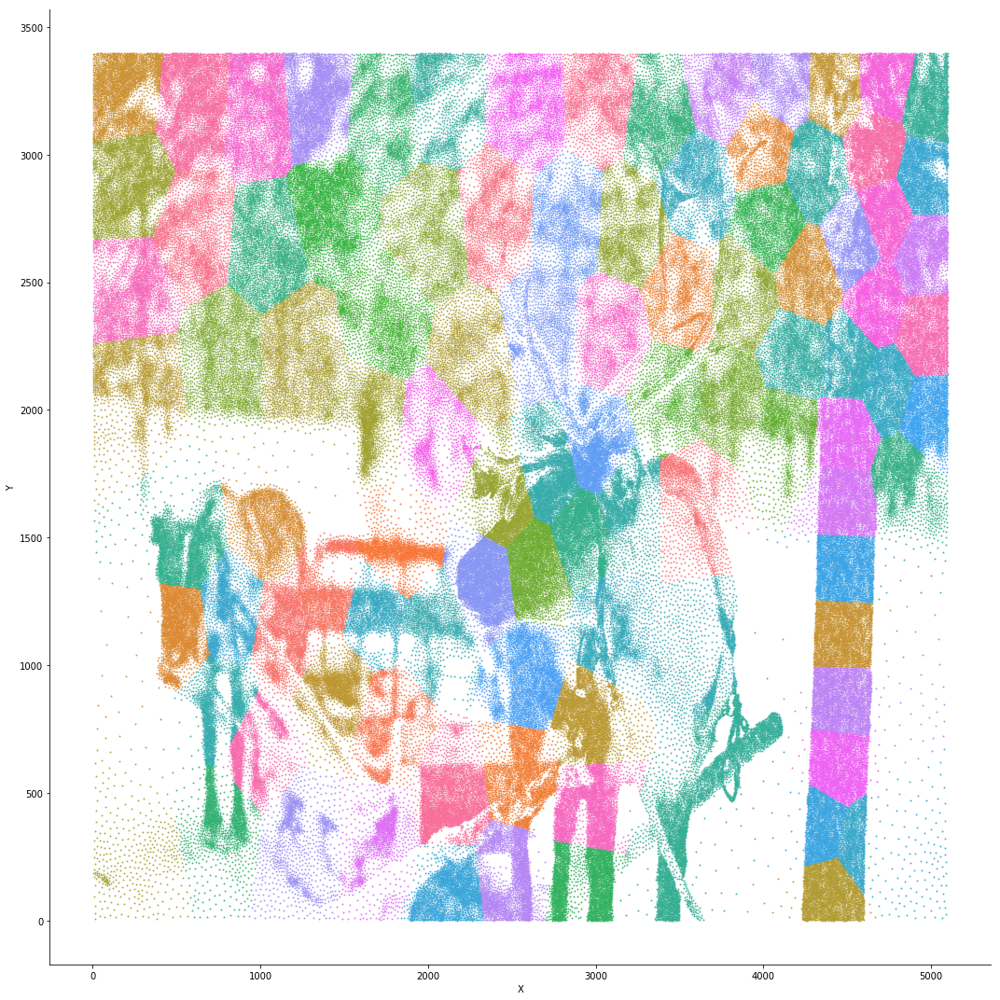

In [31]:
data['cluster'] = assignment_values
sns.lmplot("X","Y",data=data,fit_reg=False,hue="cluster",legend=False,scatter_kws={"s": 1},size=15)

### Connect the centroids to eachother

In [32]:
# function to measure shortest distance between 2 groups.
# just stop function if the distance is obviously too big.
# also returns the two points that are connected
def GetClosestDistanceBetweenGroups(group1, group2):
    shortest = 10000
    shortest_g1 = 0
    shortest_g2 = 0
    for g1 in range(0,2000):
        for g2 in range(g1+1,2000):
            if data['cluster'][g1] == group1 and data['cluster'][g2] == group2:
                dist = math.hypot(data['X'][g1] - data['X'][g2], data['Y'][g1] - data['Y'][g2])
                if dist > 1000:
                    return [group1,group2,10000,0,0]
                if dist < shortest:
                    shortest = dist
                    shortest_g1 = g1
                    shortest_g2 = g2
    return [group1, group2, shortest, g1, g2]

data.head()

,CityId,X,Y,prime,cluster,sort_order
0,0,316.836739,2202.340707,0,18,0
1,1,4377.405972,336.602082,0,65,0
2,2,3454.158198,2820.053011,1,58,0
3,3,4688.099298,2935.898056,1,96,0
4,4,1010.696952,3236.750989,0,90,0


In [33]:
# the first 2 numbers are the coordinates.
np.shape(centroid_values)

(100, 2)

## Execute Genetic algorithm on the 200 regions.

# Plot the best path

In [34]:
class TSP:
    def __init__(self, data, start_id, end_id):
        self.data = data
        self.start_id = start_id
        self.end_id = end_id
        
        # Create the data.
        self.locations = self.create_data_array()
        #locations[0], locations[100] = locations[100], locations[0]
        self.dist_matrix = self.create_distance_matrix(self.locations)
        self.dist_callback = self.create_distance_callback(self.dist_matrix)
        self.tsp_size = len(self.locations)
        self.num_routes = 1
        self.depot = start_id
        self.endpoint = end_id

        plt.figure(figsize=(18, 16), dpi=80)
        self.x = np.random.random(self.tsp_size)
        self.y = np.random.random(self.tsp_size)
        self.route = np.random.random(self.tsp_size)
        self.distance = 0

        # Create routing model.
        if self.tsp_size > 0:
            if self.endpoint > 0:
                routing = pywrapcp.RoutingModel(self.tsp_size, self.num_routes, [self.depot], [self.endpoint])
                search_parameters = pywrapcp.RoutingModel.DefaultSearchParameters()
                search_parameters.first_solution_strategy = (routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)
                routing.SetArcCostEvaluatorOfAllVehicles(self.dist_callback)

                # Solve the problem.
                assignment = routing.SolveWithParameters(search_parameters)

                self.print_routes(1, self.locations, routing, assignment)

            else:
                routing = pywrapcp.RoutingModel(self.tsp_size, self.num_routes, self.depot)
                search_parameters = pywrapcp.RoutingModel.DefaultSearchParameters()
                #search_parameters.first_solution_strategy = (routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)
                routing.SetArcCostEvaluatorOfAllVehicles(self.dist_callback)

                # Solve the problem.
                assignment = routing.SolveWithParameters(search_parameters)


                if assignment:
                    # Solution cost.
                    print("Total distance: " + str(assignment.ObjectiveValue()) + "\n")
                    self.distance = assignment.ObjectiveValue()

                    # Inspect solution.
                    # Only one route here; otherwise iterate from 0 to routing.vehicles() - 1.
                    route_number = 0
                    node = routing.Start(route_number)
                    start_node = node
                    #route = ''

                    self.x[0] = self.locations[node][0]
                    self.y[0] = self.locations[node][1]
                    self.route[0] = self.locations[node][2]
                    i = 1
                    while not routing.IsEnd(node):
                        #route += str(node) + ' -> '
                        node = assignment.Value(routing.NextVar(node))

                        if int(node) < self.tsp_size:
                            #print(i,node, city_locations[node][0], city_locations[node][1])
                            self.x[i] = self.locations[node][0]
                            self.y[i] = self.locations[node][1]
                            self.route[i] = self.locations[node][2]
                            i = i + 1

                    #route += '0'
                    #print("Route:\n\n" + route)
                else:
                    print('No solution found.')
        else:
            print('Specify an instance greater than 0.')

    def plot(self):
        print("plotting")
        plt.plot(self.x, self.y)


    def create_data_array(self):
        locations = []
        for i in range(0,len(self.data)):
            #locations.append([self.data[0],self.data[1],self.data[3]])
            locations.append(self.data[i])

        return locations;

    def euclid_distance(self,x1, y1, x2, y2):
        # Euclidean distance between points.
        dist = math.sqrt((x1 - x2)**2 + (y1 - y2)**2)
        return dist

    def create_distance_matrix(self,locations):
        # Create the distance matrix.
        size = len(locations)
        dist_matrix = {}

        for from_node in range(size):
            dist_matrix[from_node] = {}
            for to_node in range(size):
                x1 = self.data[from_node][0]
                y1 = self.data[from_node][1]
                x2 = self.data[to_node][0]
                y2 = self.data[to_node][1]
                dist_matrix[from_node][to_node] = self.euclid_distance(x1, y1, x2, y2)
        return dist_matrix

    def manhattan_distance(self, position_1, position_2):
        """Computes the Manhattan distance between two points"""
        return (abs(position_1[0] - position_2[0]) + abs(position_1[1] - position_2[1]))

    def create_distance_callback(self,dist_matrix):
        # Create the distance callback.
        def distance_callback(from_node, to_node):
            return int(self.dist_matrix[from_node][to_node])

        return distance_callback

    def get_route(self):
        return self.route
    
    def print_routes(self, num_vehicles, locations, routing, assignment):
        """Prints assignment on console"""
        total_dist = 0

        for vehicle_id in range(1):
            index = routing.Start(vehicle_id)
            plan_output = 'Route for vehicle {0}:\n'.format(vehicle_id)
            route_dist = 0

            #node = self.start_id
            #self.x[0] = self.locations[node][0]
            #self.y[0] = self.locations[node][1]
            #self.route[0] = node
            
            i = 0
            while not routing.IsEnd(index):
                node = routing.IndexToNode(index)
                next_node = routing.IndexToNode(assignment.Value(routing.NextVar(index)))
                route_dist += self.manhattan_distance(locations[node],locations[next_node])
                plan_output += ' {node} -> '.format(node=node)
                index = assignment.Value(routing.NextVar(index))

                self.x[i] = self.locations[node][0]
                self.y[i] = self.locations[node][1]
                self.route[i] = self.locations[node][2]
                i = i + 1

            node = self.end_id
            self.x[i] = self.locations[node][0]
            self.y[i] = self.locations[node][1]
            self.route[i] = self.locations[node][2]
                
            node = routing.IndexToNode(index)
            total_dist += route_dist
            plan_output += ' {node}\n'.format(node=node)
            plan_output += 'Distance of route {0}: {dist}\n'.format(vehicle_id,dist=route_dist)
            self.distance = assignment.ObjectiveValue()
            #print(plan_output)

Total distance: 39277

plotting


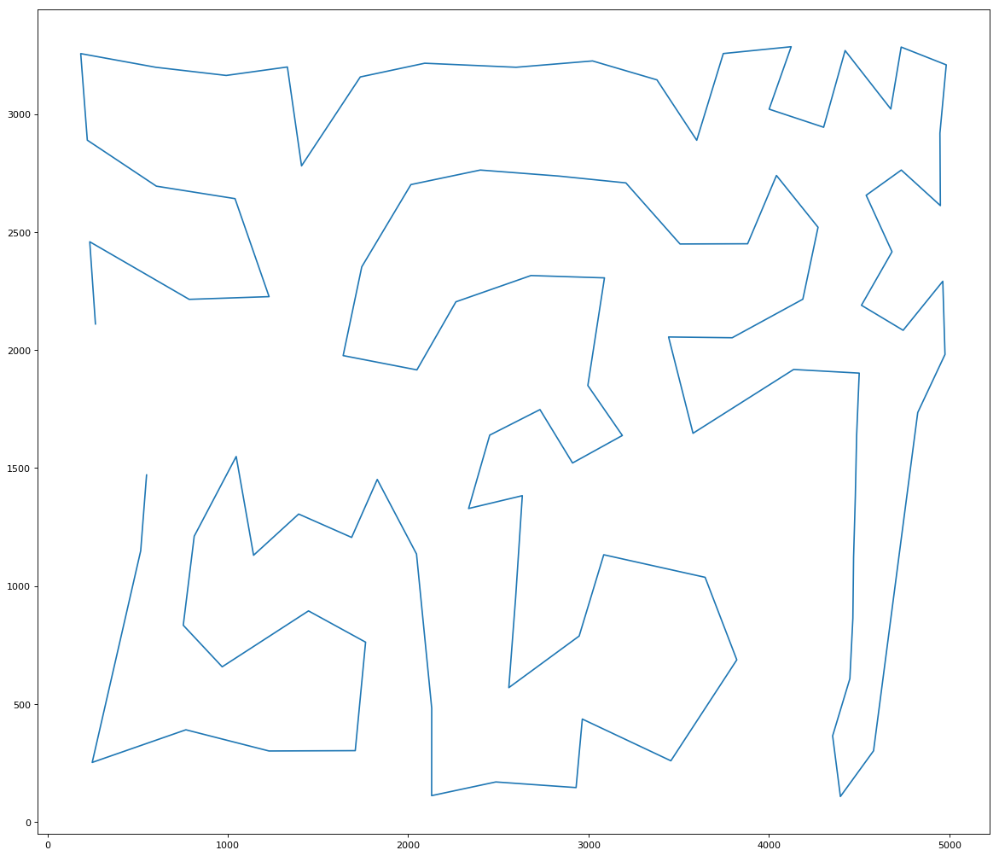

In [35]:
locations = []
for i in range(0,k):
    locations.append([centroid_values[i][0], centroid_values[i][1], i])
tsp = TSP(locations,int(data['cluster'][0]),0)
tsp.plot()
main_route = tsp.get_route()

In [36]:
print(len(main_route),len(centroid_values))

100 100


In [37]:
# For each k make a beginning and an ending depending on next and previous k position.
def distance(x1,y1,x2,y2):
    dist = math.sqrt((x1 - x2)**2 + (y1 - y2)**2)
    return dist

beginnings = np.zeros(k)
endings = np.zeros(k)

# get the start and the end in each k.
for c in range(k):
    this_c = int(main_route[c])

    sorted = pd.DataFrame(data[data['cluster'] == this_c])
    
    # look previous
    if c > 0:
        prev_c = int(main_route[c - 1])
        md = 1000000
        cx = centroid_values[prev_c][0]
        cy = centroid_values[prev_c][1]
        for i in sorted['CityId']:
            d = distance(cx,cy,data['X'][i],data['Y'][i])
            if d < md:
                md = d
                beginnings[this_c] = int(i)
    else:
        beginnings[this_c] = 0
    
    # Look next
    if c < k-1:
        next_c = int(main_route[c + 1])
        md = 1000000
        cx = centroid_values[next_c][0]
        cy = centroid_values[next_c][1]
        for i in sorted['CityId']:
            d = distance(cx,cy,data['X'][i],data['Y'][i])
            if d < md:
                md = d
                endings[this_c] = int(i)
    else:
        endings[this_c] = 0
        

In [38]:
#sorted = pd.DataFrame(data[data['cluster'] == 1])
#sorted['CityId'][1:2]
#cluster
#beginnings[int(cluster)]
#print(beginnings[2],int(endings[2]))
#print(centroid_values[2-1][0],centroid_values[2+1][0])

data['sort_order'] = 0

In [39]:
routed_index = 0
total_distance = 0

for t in range(k):
    cluster = main_route[t]
    sorted = pd.DataFrame(data[data['cluster'] == cluster])
    print("route " + str(t) + " " + str(len(sorted)) + " cities.")
    locations = []
    b = 0
    e = 0
    index = 0
    for i in sorted['CityId']:
        locations.append([data['X'][i], data['Y'][i], i])
        if i == beginnings[int(cluster)]:
            b = index
            print("beginning: " + str(index) + " " + str(data['X'][i]) + " " + str(data['Y'][i]))
        if i == endings[int(cluster)]:
            e = index
            print("end: " + str(index) + " " + str(data['X'][i]) + " " + str(data['Y'][i]))
        index = index + 1

    tsp = TSP(locations,b,e)
    #tsp.plot()
    #print(b,e)
    #print(len(locations))
    total_distance = total_distance + tsp.distance
    print("total distance: " + str(total_distance))
    
    #print(tsp.route)
    # now write route in data
    for i in tsp.route:
        ii = int(i)
        data['sort_order'][ii] = routed_index
        routed_index = routed_index + 1
    #print("cities ordered: " + str(data['sort_order' > 0].sum() ))

        
sorted = data.sort_values(by=['sort_order'])
sorted.head()
data.to_csv('data/routed.csv')
sorted.to_csv('data/routed2.csv')
sorted[['CityId']].to_csv('data/submit.csv',index=False)

route 0 2011 cities.
beginning: 0 316.83673906150904 2202.34070733524
end: 1709 250.890420735984 2284.52952999632
total distance: 20042


C:\Users\bob\Anaconda3\envs\tf_gpu\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


route 1 2409 cities.
beginning: 715 244.47822405764703 2287.6307217478
end: 2179 504.123920663321 2324.79870034013
total distance: 38485
route 2 2478 cities.
end: 1086 1005.95808698756 2190.0759317155603
beginning: 2243 516.722948002829 2344.5116496820497
total distance: 61003
route 3 2389 cities.
beginning: 356 1009.0667992031099 2221.38908179418
end: 1123 1126.12133195733 2429.41598487721
total distance: 82305
route 4 2712 cities.
beginning: 172 1132.3486746494802 2433.28144442018
end: 970 826.689811419335 2699.96227674295
total distance: 102973
route 5 2313 cities.
beginning: 1469 819.267851096895 2645.20361848119
end: 1703 434.750305949095 2828.91853070508
total distance: 122099
route 6 3005 cities.
beginning: 1736 400.46015197927 2772.7637808132104
end: 2803 195.39187895969602 3071.51667792437
total distance: 142132
route 7 2716 cities.
beginning: 1601 216.894759506049 3074.37052031219
end: 2628 393.807452417862 3250.8046200131703
total distance: 158239
route 8 3530 cities.
end: 4

C:\Users\bob\Anaconda3\envs\tf_gpu\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


total distance: 364800
route 21 1869 cities.
end: 894 4363.99858137425 3106.2304294467103
beginning: 1695 4155.9170203986205 2992.22948525428
total distance: 377477
route 22 1197 cities.
end: 475 4541.27303455089 3141.1629905311797
beginning: 480 4358.03691151163 3108.65117641362
total distance: 386495
route 23 2269 cities.
end: 875 4711.16391490493 3151.12302562482
beginning: 1825 4562.496539805061 3156.42827178368
total distance: 398699
route 24 1868 cities.
beginning: 452 4717.34129448382 3152.48721670168
end: 1221 4857.25943873505 3244.2232001633397
total distance: 408724
route 25 1924 cities.
beginning: 552 4856.7019820940795 3239.53865358357
end: 969 4955.03203513056 3065.62075099536
total distance: 419665
route 26 1930 cities.
end: 581 4965.50083320385 2766.5701782039196
beginning: 1454 4965.38467628167 3060.36402200026
total distance: 430488
route 27 1851 cities.
end: 214 4839.105864683371 2682.68396050227
beginning: 1752 4955.85748121157 2765.5188822266805
total distance: 4416

total distance: 1178977
route 80 2315 cities.
end: 459 2311.2874532528303 128.743393581471
beginning: 1031 2700.83220137667 136.599362845182
total distance: 1193451
route 81 2143 cities.
end: 812 2171.76429605307 293.476027384543
beginning: 1496 2304.0478844014497 160.711602454462
total distance: 1206802
route 82 3068 cities.
end: 684 2133.79060972273 810.915790823512
beginning: 816 2136.44167056392 301.30154553523397
total distance: 1226547
route 83 1253 cities.
end: 290 1936.4084659798498 1288.47816139223
beginning: 870 2101.84787970437 822.1205770021401
total distance: 1238412
route 84 1513 cities.
end: 179 1750.1195031925101 1335.21894424175
beginning: 1283 1955.40492424385 1307.7329715678
total distance: 1250510
route 85 1340 cities.
beginning: 95 1759.40373897272 1319.7861293821002
end: 1144 1541.91326616165 1258.6846577251401
total distance: 1260539
route 86 1673 cities.
end: 174 1259.37083449945 1234.87244887579
beginning: 647 1536.91747384587 1247.17914579079
total distance: 1

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

<Figure size 1440x1280 with 0 Axes>

In [ ]:
# total distance: 1454912
#print(main_route[0])
#print("cities ordered: " + str(len(data[data.sort_order > 0]) ))
#print("cities : " + str(len(data[data.cluster == 165]) ))

### last step is make sure every 10th is a prime. and then measure the total distance

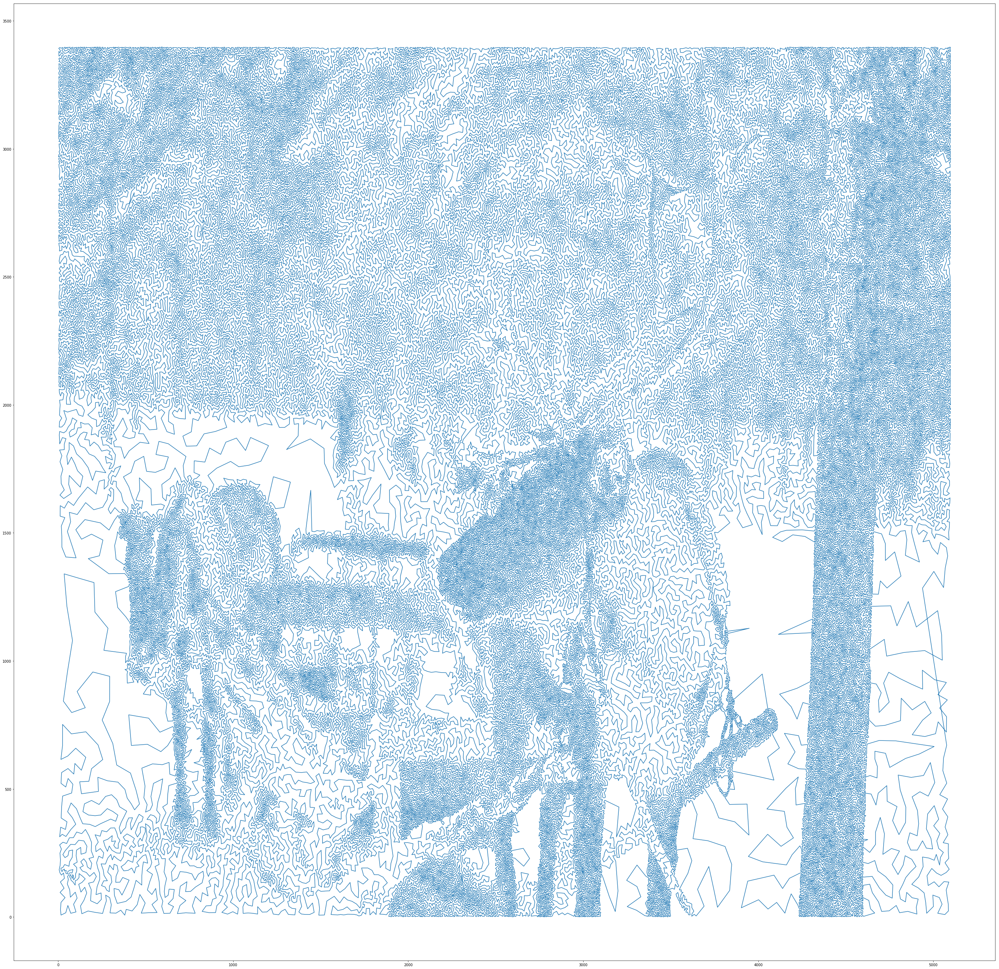

In [68]:
# Plot the route.
fig = plt.gcf()
fig.set_size_inches(50, 50)
#fig.savefig('test2png.png', dpi=100)

plt.plot(sorted['X'], sorted['Y'])
#data.plot()

In [ ]:
#sorted = pd.DataFrame(data[data['locked'] == 0])

#sorted = data.sort_values(by=['sort_order'])
#sorted = data.sort_values(by='sort_order', ascending=False)
#sorted.head()

#sorted = pd.DataFrame(data[data['cluster'] == cluster])
#len(sorted)

In [ ]:
#data = pd.read_csv("data/routed.csv")
#sorted = pd.DataFrame(data[data['locked'] == 0])
#data = data.sort_values(by=['sort_order'])
#print(len(sorted))
#data.head()

In [ ]:
#for s in sorted['CityId']:
#    if sorted['locked'][s] == 1:
#        data['locked'][s] = 1
"""
def find_closest_prime(city,x,y):
    global sorted
    closest_city = 0
    closest_distance = 1000000
    for s in sorted['CityId']:
        if sorted['prime'][s] == 1 and sorted['locked'][s] == 0:
            d = distance(x,y,sorted['X'][s],sorted['Y'][s])
            if d < closest_distance:
                closest_distance = d
                closest_city = s
    
    # Mark returned city as locked.
    sorted['locked'][city] = 1
    sorted['locked'][closest_city] = 1
    return closest_city,closest_distance

index = 0
total = 0
for city in data['CityId']:
    index = index + 1
    total = total + 1
    if index == 10:
        index = 0
        if data['prime'][city] == 0 and data['locked'][city] == 0:
            print(total)
            # find closest prime.
            c,d = find_closest_prime(city, data['X'][city],data['Y'][city])
            data['locked'][city] = 1
            
            # flip the sort order of these two cities.
            data['sort_order'][c], data['sort_order'][city] = data['sort_order'][city], data['sort_order'][c]
            
            
            #print("closest to (" + str(data['X'][index]) + " " + str(data['Y'][index]) + ") is (" + str(data['X'][c]) + " " + str(data['Y'][c]) + ")")
            print("indexes: " + str(city) + " " + str(c))
            print("distance: " + str(d))
            
"""

In [ ]:
#print(data['sort_order'][746])
#print(str(len(data)))

In [ ]:
#data['locked'][3] = 0
#sorted['locked'][3] = 0
#print(sorted['locked'][3])
#print(data['locked'][3])

In [ ]:
#data['sort_order'][114801] = 10
#data['sort_order'][114802] = 11
#data['sort_order'][114801]

In [ ]:
#data['sort_order'][50399]

In [ ]:
#locked

In [ ]:
#locked[81289]

In [ ]:
#sort_order[100]

In [ ]:
#data.from_csv('data/routed.csv')
#data = pd.read_csv("data/routed.csv")
#data.head()

In [ ]:
#sorted['X'][275]

In [ ]:
#sorted = data.sort_values(by=['sort_order'])
#sorted.head()

In [ ]:
# 'Unnamed: 0',
#data = data.drop(['prime','cluster','sort_order','locked','X','Y'], axis=1)
#data.head()
#sorted[['CityId']].head()

In [ ]:
#sorted[['CityId']].to_csv('data/submit.csv',index=False)